Importing Libraries

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt_alias
import seaborn as sns
import nltk 
import re
import wordcloud as wc

In [5]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Embedding, LSTM, Conv1D, MaxPool1D
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score

In [6]:
real_df = pd.read_csv("real.csv")
fake_df = pd.read_csv("fake.csv")

Analyzing the datasets

In [7]:
real_df.head()

,title,text,subject,date
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,"December 31, 2017"
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,"December 29, 2017"
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,"December 31, 2017"
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,"December 30, 2017"
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,"December 29, 2017"


In [8]:
fake_df.head()

,title,text,subject,date
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,"December 31, 2017"
1,Drunk Bragging Trump Staffer Started Russian ...,House Intelligence Committee Chairman Devin Nu...,News,"December 31, 2017"
2,Sheriff David Clarke Becomes An Internet Joke...,"On Friday, it was revealed that former Milwauk...",News,"December 30, 2017"
3,Trump Is So Obsessed He Even Has Obama’s Name...,"On Christmas day, Donald Trump announced that ...",News,"December 29, 2017"
4,Pope Francis Just Called Out Donald Trump Dur...,Pope Francis used his annual Christmas Day mes...,News,"December 25, 2017"


In [9]:
real_df.shape, fake_df.shape

((21417, 4), (23481, 4))

In [10]:
fake_df['subject'].value_counts()

News               9050
politics           6841
left-news          4459
Government News    1570
US_News             783
Middle-east         778
Name: subject, dtype: int64

This shows the graph for various types of news in the fake.csv dataset

<AxesSubplot: xlabel='subject', ylabel='count'>

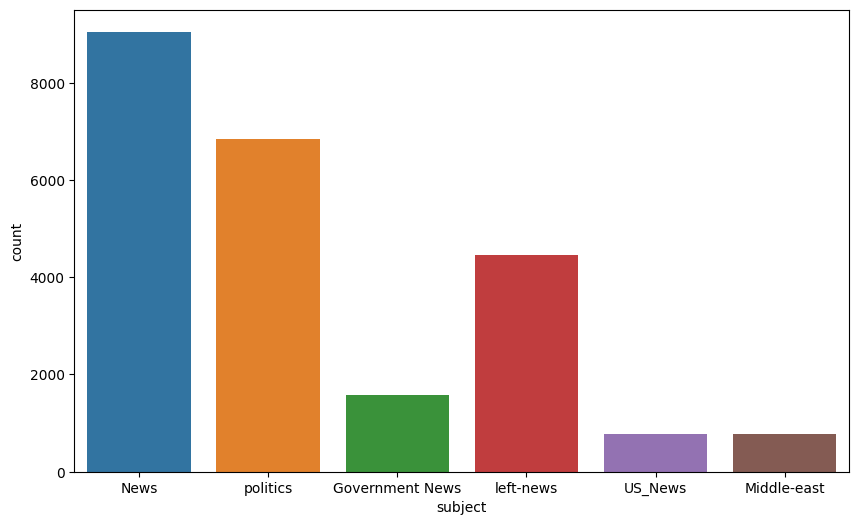

In [11]:
plt_alias.figure(figsize=(10, 6))
sns.countplot(x = 'subject', data=fake_df)

In [12]:
## Wordcloud
text = ' '.join(fake_df['text'].tolist()) # Coverting fake test data into list

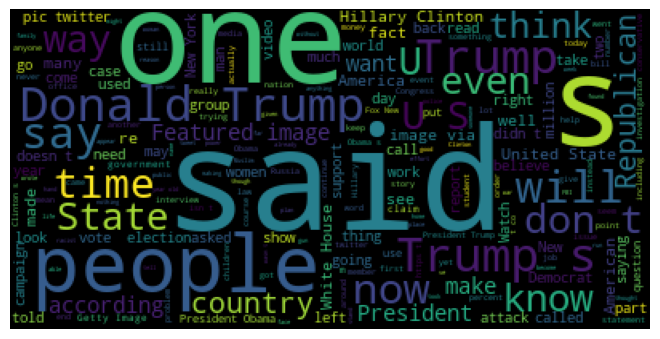

In [13]:
wordcloud = wc.WordCloud().generate(text)
from wordcloud import WordCloud
wordcloud = WordCloud().generate(text)
plt_alias.imshow(wordcloud)
plt_alias.axis('off')
plt_alias.tight_layout(pad=0)
plt_alias.show()

In [14]:
#Exploring real news
real_df['subject'].value_counts()

politicsNews    11272
worldnews       10145
Name: subject, dtype: int64

In [15]:
## Wordcloud
text = ' '.join(real_df['text'].tolist()) # Coverting real test data into list

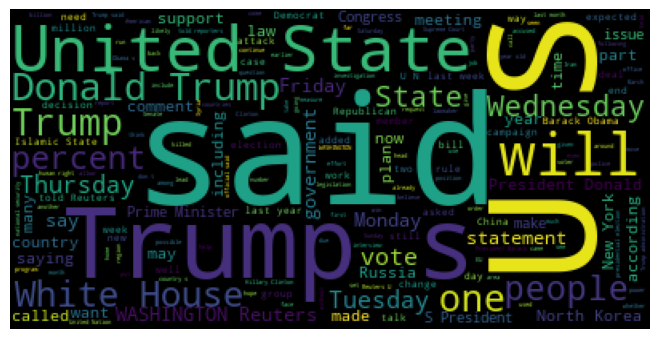

In [16]:
wordcloud = wc.WordCloud().generate(text)
from wordcloud import WordCloud
wordcloud = WordCloud().generate(text)
plt_alias.imshow(wordcloud)
plt_alias.axis('off')
plt_alias.tight_layout(pad=0)
plt_alias.show()

In [17]:
real_df.sample(6)

,title,text,subject,date
875,Trump supports Republican tax overhaul bill: a...,WASHINGTON (Reuters) - U.S. President Donald T...,politicsNews,"November 2, 2017"
8783,"Responding to criticism, Trump calls on Justic...",WASHINGTON (Reuters) - U.S. Republican preside...,politicsNews,"July 13, 2016"
20580,Saudi Arabia suspends any dialogue with Qatar:...,DUBAI (Reuters) - Saudi Arabia on Saturday sus...,worldnews,"September 8, 2017"
13750,"Water entered missing Argentine sub's snorkel,...",BUENOS AIRES (Reuters) - Water entered the sno...,worldnews,"November 27, 2017"
10393,Exclusive: U.S. labor powerhouse to launch ant...,"WASHINGTON (Reuters) - The AFL-CIO, the larges...",politicsNews,"March 11, 2016"
16702,"Despite apology, Indonesia asks why U.S. block...",JAKARTA (Reuters) - Indonesia said on Monday i...,worldnews,"October 23, 2017"


In [18]:
unknown_publishers = []
for index, row in enumerate(real_df.text.values):
    try:
        record = row.split(' - ', maxsplit=1)
        record[1]
        
        assert(len(record[0])<120)
    except:
        unknown_publishers.append(index)


In [19]:
len(unknown_publishers)

229

In [20]:
real_df.iloc[unknown_publishers]

,title,text,subject,date
7,Factbox: Trump on Twitter (Dec 29) - Approval ...,The following statements were posted to the ve...,politicsNews,"December 29, 2017"
8,Trump on Twitter (Dec 28) - Global Warming,The following statements were posted to the ve...,politicsNews,"December 29, 2017"
12,Factbox: Trump on Twitter (Dec 28) - Vanity Fa...,The following statements were posted to the ve...,politicsNews,"December 28, 2017"
13,"Trump on Twitter (Dec 27) - Trump, Iraq, Syria",The following statements were posted to the ve...,politicsNews,"December 28, 2017"
14,Man says he delivered manure to Mnuchin to pro...,"(In Dec. 25 story, in second paragraph, corre...",politicsNews,"December 25, 2017"
...,...,...,...,...
20135,China's big money trumps U.S. influence in Cam...,(Story corrects to million from billion in pa...,worldnews,"September 11, 2017"
20500,UK publisher rejected request to block academi...,"(This Sept 8 story corrects headline, clarifi...",worldnews,"September 8, 2017"
20667,Rohingya say their village is lost to Myanmar'...,"(Story refiles to add dropped word not , in ...",worldnews,"September 7, 2017"
21246,'Gates of Hell': Iraqi army says fighting near...,(Story corrects third paragraph to show Mosul...,worldnews,"August 29, 2017"


In [21]:
real_df.iloc[unknown_publishers].text

7        The following statements were posted to the ve...
8        The following statements were posted to the ve...
12       The following statements were posted to the ve...
13       The following statements were posted to the ve...
14        (In Dec. 25 story, in second paragraph, corre...
                               ...                        
20135     (Story corrects to million from billion in pa...
20500     (This Sept 8 story corrects headline, clarifi...
20667     (Story refiles to add dropped word  not , in ...
21246     (Story corrects third paragraph to show Mosul...
21339     (Story corrects to fix spelling in paragraph ...
Name: text, Length: 229, dtype: object

In [22]:
real_df.iloc[8970]

title      Graphic: Supreme Court roundup
text                                     
subject                      politicsNews
date                       June 16, 2016 
Name: 8970, dtype: object

Dropping the row (8970) because it has empty title

In [23]:
#real_df = real_df.drop(8970)

Unknown_publisher is used  where the publisher is unknown or the length of the publisher name is too long, which could indicate an issue with the data. The unknown_publishers list can be used to investigate these issues further.

In [24]:
publisher = []
tmp_text = []

for index, row in enumerate(real_df.text.values):
    if index in unknown_publishers:
        tmp_text.append(row)
        publisher.append('Unknown')
        
    else:
        record = row.split('-', maxsplit=1)
        publisher.append(record[0].strip())
        tmp_text.append(record[1].strip())

In [25]:
real_df['publisher']= publisher
real_df['text'] = tmp_text

In [26]:
empty_fake_df_index = [index for index,text in enumerate(fake_df.text.tolist()) if str(text).strip()==""]

In [27]:
fake_df.iloc[empty_fake_df_index] # fake news data - empty 

,title,text,subject,date
10923,TAKE OUR POLL: Who Do You Think President Trum...,,politics,"May 10, 2017"
11041,Joe Scarborough BERATES Mika Brzezinski Over “...,,politics,"Apr 26, 2017"
11190,WATCH TUCKER CARLSON Scorch Sanctuary City May...,,politics,"Apr 6, 2017"
11225,MAYOR OF SANCTUARY CITY: Trump Trying To Make ...,,politics,"Apr 2, 2017"
11236,SHOCKER: Public School Turns Computer Lab Into...,,politics,"Apr 1, 2017"
...,...,...,...,...
21816,BALTIMORE BURNS: MARYLAND GOVERNOR BRINGS IN N...,,left-news,"Apr 27, 2015"
21826,FULL VIDEO: THE BLOCKBUSTER INVESTIGATION INTO...,,left-news,"Apr 25, 2015"
21827,(VIDEO) HILLARY CLINTON: RELIGIOUS BELIEFS MUS...,,left-news,"Apr 25, 2015"
21857,(VIDEO)ICE PROTECTING OBAMA: WON’T RELEASE NAM...,,left-news,"Apr 14, 2015"


In [28]:
real_df['text'] = real_df['title'] + " " + real_df['text']
fake_df['text'] = fake_df['title'] + " " + fake_df['text']

In [29]:
real_df['text'] = real_df['text'].apply(lambda x: str(x).lower())
fake_df['text'] = fake_df['text'].apply(lambda x: str(x).lower())

In [30]:
#Preprocessing Text
real_df['class'] = 1
fake_df['class'] = 0

In [31]:
real_df.columns

Index(['title', 'text', 'subject', 'date', 'publisher', 'class'], dtype='object')

In [32]:
real_df =real_df[['text', 'class']]

In [33]:
fake_df =fake_df[['text', 'class']]

In [34]:
data = pd.concat([real_df, fake_df], ignore_index=True)

In [35]:
data.sample(10)

,text,class
24402,watch: elizabeth warren owns trump in scathin...,0
27072,angry that benghazi panel couldn’t bury hilla...,0
8647,former new york city mayor bloomberg to endors...,1
5154,senate approves carson for housing secretary j...,1
36896,how failed democrat leadership is taking nyc b...,0
15561,catalonia's ex-leader granted freedom to campa...,1
4965,tillerson's email alias was prompted by busine...,1
29902,the chilling police abuse footage oakland cop...,0
10821,"obama, southeast asia leaders eye china and tr...",1
2302,white house considers lower deduction for u.s....,1


In [36]:
import preprocess_kgptalkie as ps

data['text'] = data['text'].apply(lambda x: ps.remove_special_chars(x))

In [37]:
#Vectorization --Word2vec
import gensim
y = data['class'].values

In [38]:
X = [d.split() for d in data['text'].tolist()] # convert text data into list of list.

In [39]:
type(X[0])

list

In [40]:
print(X[0])

['as', 'us', 'budget', 'fight', 'looms', 'republicans', 'flip', 'their', 'fiscal', 'script', 'the', 'head', 'of', 'a', 'conservative', 'republican', 'faction', 'in', 'the', 'us', 'congress', 'who', 'voted', 'this', 'month', 'for', 'a', 'huge', 'expansion', 'of', 'the', 'national', 'debt', 'to', 'pay', 'for', 'tax', 'cuts', 'called', 'himself', 'a', 'fiscal', 'conservative', 'on', 'sunday', 'and', 'urged', 'budget', 'restraint', 'in', '2018', 'in', 'keeping', 'with', 'a', 'sharp', 'pivot', 'under', 'way', 'among', 'republicans', 'us', 'representative', 'mark', 'meadows', 'speaking', 'on', 'cbs', 'face', 'the', 'nation', 'drew', 'a', 'hard', 'line', 'on', 'federal', 'spending', 'which', 'lawmakers', 'are', 'bracing', 'to', 'do', 'battle', 'over', 'in', 'january', 'when', 'they', 'return', 'from', 'the', 'holidays', 'on', 'wednesday', 'lawmakers', 'will', 'begin', 'trying', 'to', 'pass', 'a', 'federal', 'budget', 'in', 'a', 'fight', 'likely', 'to', 'be', 'linked', 'to', 'other', 'issues',

Feature Extraction

In [41]:
DIM = 100 # these words will converted into sequence of 100 vectors.
w2v_model =  gensim.models.Word2Vec(sentences=X, vector_size=DIM, window=15, min_count=1)

In [42]:
word_vectors = w2v_model.wv
vocab_size = len(word_vectors.index_to_key)
print("Number of words in the vocabulary:", vocab_size)

Number of words in the vocabulary: 231910


In [43]:
w2v_model.wv['usa']

array([-1.489185  , -0.4412628 ,  2.043657  , -2.1309361 , -2.5853202 ,
       -1.7984526 ,  1.1633856 ,  3.2500474 , -1.4409374 ,  2.0804884 ,
        0.29084906,  2.1158047 ,  1.0318563 , -0.8374048 , -2.7033255 ,
       -0.70929843, -0.11685404,  0.22442324, -2.2041464 , -1.6235044 ,
        1.7042203 , -2.8509686 , -0.2164296 ,  0.49613062,  1.5990204 ,
        1.5020231 ,  1.1334069 ,  1.250899  ,  0.20934157,  1.1993331 ,
        1.5897962 , -1.0211527 ,  1.4572384 ,  1.0648831 , -0.47828054,
        3.4636874 ,  0.32622018, -0.66188586,  0.07341538, -3.1347167 ,
        0.247563  , -1.4180412 , -0.3097827 , -1.3366642 ,  0.6787667 ,
        1.6376936 , -0.582412  , -1.9713666 ,  1.5353973 , -2.6194139 ,
       -2.3413174 ,  1.9240195 ,  0.10143863,  0.53984463,  0.5846667 ,
       -2.542747  , -1.1997641 ,  2.728761  ,  0.322166  ,  3.2664645 ,
       -1.9025179 , -2.553378  ,  0.78290874, -0.42179245, -2.204616  ,
        0.3869204 ,  0.15119077,  0.51177937, -0.4370016 , -0.66

In [44]:
w2v_model.wv.most_similar('india')

[('pakistan', 0.7173402905464172),
 ('indian', 0.6852254867553711),
 ('modi', 0.6602126359939575),
 ('narendra', 0.6489939093589783),
 ('malaysia', 0.6383485198020935),
 ('china', 0.6000370383262634),
 ('gwadar', 0.5917784571647644),
 ('usindia', 0.589764416217804),
 ('cpec', 0.5818421244621277),
 ('beijings', 0.5798386335372925)]

In [45]:
# Initialize the Tokenizer
tokenizer = Tokenizer()
# Fit the Tokenizer on your text data
tokenizer.fit_on_texts(X)

In [46]:
X = tokenizer.texts_to_sequences(X)

In [47]:
X

[[18,
  30,
  473,
  480,
  10667,
  133,
  8089,
  40,
  1375,
  5172,
  1,
  419,
  3,
  4,
  301,
  79,
  6312,
  6,
  1,
  30,
  189,
  29,
  773,
  26,
  279,
  9,
  4,
  1107,
  2956,
  3,
  1,
  124,
  954,
  2,
  447,
  9,
  184,
  1193,
  173,
  394,
  4,
  1375,
  301,
  8,
  342,
  5,
  1110,
  473,
  7805,
  6,
  1188,
  6,
  1764,
  16,
  4,
  3407,
  7897,
  141,
  164,
  320,
  133,
  30,
  798,
  921,
  7806,
  675,
  8,
  2010,
  476,
  1,
  383,
  1761,
  4,
  559,
  589,
  8,
  168,
  691,
  50,
  408,
  28,
  17340,
  2,
  89,
  1352,
  65,
  6,
  410,
  60,
  32,
  776,
  25,
  1,
  8090,
  8,
  203,
  408,
  39,
  1438,
  350,
  2,
  929,
  4,
  168,
  473,
  6,
  4,
  480,
  304,
  2,
  22,
  1957,
  2,
  80,
  426,
  170,
  18,
  313,
  208,
  107,
  18,
  1,
  515,
  570,
  96,
  1781,
  1504,
  6,
  50,
  133,
  39,
  1072,
  2,
  377,
  349,
  3,
  189,
  37,
  68,
  14,
  5,
  19,
  133,
  182,
  4,
  379,
  473,
  959,
  6,
  169,
  691,
  110,
  196,
  62,

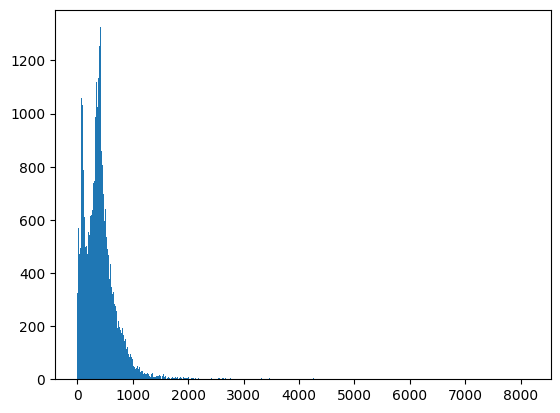

In [48]:
#tokenizer.word_index
#Analyze our text data which we currently have
plt_alias.hist([len(x) for x in X], bins = 700)
#Histogram data of total number of words present in our news.
plt_alias.show()

In [49]:
nos = np.array([len(x) for x in X])
len(nos[nos>1000])

1584

In [50]:
maxlen= 1000
X = pad_sequences(X,maxlen=maxlen)# when sequence>1000 then truncated , when sequence<1000, the the 0 is added.

In [51]:
len(X[150]) # we always getting thousand 

1000

In [52]:
vocab_size = len(tokenizer.word_index)+ 1
vocab = tokenizer.word_index

def get_weight_matrix(model):
    weight_matrix = np.zeros((vocab_size, DIM))
    
    for word, i in vocab.items():
         weight_matrix[i] = model.wv[word]
            
    return weight_matrix
        

In [53]:
embedding_vectors = get_weight_matrix(w2v_model)

In [54]:
embedding_vectors.shape

(231911, 100)

Model Selection- using LSTM ( Long Short-Term Memory)

In [55]:
model = Sequential()
model.add(Embedding(vocab_size, output_dim=DIM, weights = [embedding_vectors], input_length=maxlen, trainable=False))
model.add(LSTM(units=128))
model.add(Dense(1, activation='sigmoid'))
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['acc'])

In [56]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 1000, 100)         23191100  
                                                                 
 lstm (LSTM)                 (None, 128)               117248    
                                                                 
 dense (Dense)               (None, 1)                 129       
                                                                 
Total params: 23,308,477
Trainable params: 117,377
Non-trainable params: 23,191,100
_________________________________________________________________


In [60]:
X_train, X_test, y_train, y_test = train_test_split(X,y)

In [61]:
model.fit(X_train, y_train, validation_split=0.3, epochs=1)

737/737 [==============================] - 652s 885ms/step - loss: 0.0714 - acc: 0.9752 - val_loss: 0.0411 - val_acc: 0.9860


In [62]:
#save the model
model.save('fake_news_detection_model.h5')

In [63]:
y_pred = (model.predict(X_test) >=0.5).astype(int)

351/351 [==============================] - 99s 280ms/step


 Classification report of the model.

In [58]:
print (classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       1.00      0.89      0.94      5818
           1       0.89      1.00      0.94      5407

    accuracy                           0.94     11225
   macro avg       0.94      0.94      0.94     11225
weighted avg       0.95      0.94      0.94     11225



In [63]:
accuracy_score(y_test, y_pred)

0.9403118040089087

Model validation

In [64]:
a = ["Malaysia grew at the quickest pace in over two decades in 2022, making it the fastest-growing economy in Asia, as the pent-up demand helped the nation's GDP grow to 8.7 per cent, the highest level since 2000, data from the Bank Negara Malaysia and the Department of Statistics showed, Bloomberg reported."]
a = tokenizer.texts_to_sequences(a)
a = pad_sequences(a, maxlen=maxlen)
(model.predict(a) >=0.5).astype(int)

1/1 [==============================] - 0s 58ms/step


array([[1]])

In [60]:
x = ["Giving further details on the launch, US Air Force said the ICBM's test re-entry vehicle travelled approximately 4,200 miles to the Kwajalein Atoll in the Marshall Islands. It added that the trajectory displays the accuracy and reliability of the US ICBM systems."]
x = tokenizer.texts_to_sequences(x)
x = pad_sequences(x, maxlen=maxlen)
(model.predict(x) >=0.5).astype(int)

1/1 [==============================] - 0s 127ms/step


array([[1]])

In [62]:
x = ["Ankit raha, The MLA of BJP has become the president of India- BBC news"]
x = tokenizer.texts_to_sequences(x)
x = pad_sequences(x, maxlen=maxlen)
(model.predict(x) >=0.5).astype(int)

1/1 [==============================] - 0s 117ms/step


array([[0]])

In [70]:
user_input = input("Enter text or link: ")
x = [user_input]
x = tokenizer.texts_to_sequences(x)
x = pad_sequences(x, maxlen=maxlen)
(model.predict(x) >=0.5).astype(int)

Enter text or link: https://economictimes.indiatimes.com/news/international/world-news/only-way-forward-in-relations-with-india-is-pm-modi-first-restores-kashmirs-special-status-imran-khan/articleshow/97713621.cms
1/1 [==============================] - 0s 57ms/step


array([[1]])

In [65]:
user_input = input("Enter text or link: ")
x = [user_input]
x = tokenizer.texts_to_sequences(x)
x = pad_sequences(x, maxlen=maxlen)
(model.predict(x) >=0.5).astype(int)

Enter text or link: https://www.washingtonpost.com/news/fact-checker/wp/2016/08/11/too-good-to-check-sean-hannitys-tale-of-a-trump-rescue/?utm_term=.b25fb6d63373
1/1 [==============================] - 0s 66ms/step


array([[0]])

In [66]:
user_input = input("Enter text or link: ")
x = [user_input]
x = tokenizer.texts_to_sequences(x)
x = pad_sequences(x, maxlen=maxlen)
(model.predict(x) >=0.5).astype(int)

Enter text or link: http://www.snopes.com/pope-francis-donald-trump-endorsement/
1/1 [==============================] - 0s 66ms/step


array([[0]])

In [67]:
user_input = input("Enter text or link: ")
x = [user_input]
x = tokenizer.texts_to_sequences(x)
x = pad_sequences(x, maxlen=maxlen)
(model.predict(x) >=0.5).astype(int)

Enter text or link: Narendra Modi is the Prime Minister of India
1/1 [==============================] - 0s 66ms/step


array([[1]])

In [76]:
user_input = input("Enter text or link: ")
x = [user_input]
x = tokenizer.texts_to_sequences(x)
x = pad_sequences(x, maxlen=maxlen)
(model.predict(x) >=0.5).astype(int)

Enter text or link: https://twitter.com/tansuyegen/status/1594264753693757442
1/1 [==============================] - 0s 77ms/step


array([[0]])

In [95]:
user_input = input("Enter text or link: ")
x = [user_input]
x = tokenizer.texts_to_sequences(x)
x = pad_sequences(x, maxlen=maxlen)
(model.predict(x) >=0.5).astype(int)

Enter text or link: https://twitter.com/EmmanuelMacron/status/1164617008962527232/photo/1
1/1 [==============================] - 0s 74ms/step


array([[0]])

In [83]:
user_input = input("Enter text or link: ")
x = [user_input]
x = tokenizer.texts_to_sequences(x)
x = pad_sequences(x, maxlen=maxlen)
(model.predict(x) >=0.5).astype(int)

Enter text or link: https://twitter.com/EmmanuelMacron/status/1164617008962527232/photo/1
1/1 [==============================] - 0s 106ms/step


array([[0]])

In [71]:
user_input = input("Enter text or link: ")
x = [user_input]
x = tokenizer.texts_to_sequences(x)
x = pad_sequences(x, maxlen=maxlen)
(model.predict(x) >=0.5).astype(int)

Enter text or link: Pranav Pratyush was the President of India.
1/1 [==============================] - 0s 65ms/step


array([[0]])

In [76]:
user_input = input("Enter text or link: ")
x = [user_input]
x = tokenizer.texts_to_sequences(x)
x = pad_sequences(x, maxlen=maxlen)
(model.predict(x) >=0.5).astype(int)

Enter text or link: Amit Shah's June 2019 Srinagar visit was to give final touch before Article 370 
1/1 [==============================] - 0s 57ms/step


array([[1]])

Integrating web scrapping, image detection and fake image classification 

In [77]:
def x(text):
    print("The input is text:", text)

def y(link):
    print("The input is a link:", link)

user_input = input("Enter text or link: ")

if user_input.startswith("http"):
    y(user_input)
else:
    x(user_input)

Enter text or link: https://thewire.in/government/allegations-of-transfer-pricing-non-compliance-do-not-warrant-an-it-survey-on-bbc
The input is a link: https://thewire.in/government/allegations-of-transfer-pricing-non-compliance-do-not-warrant-an-it-survey-on-bbc


Enter text or link: https://en.wikipedia.org/wiki/Fake_news
Title: Fake news - Wikipedia

Main Text:
 False or misleading information presented as news This article is about a general discussion of false or misleading information presented as news. For the online type and the websites that specialize in it, see Fake news website. For other uses, see Fake news (disambiguation).   Fake news is false or misleading information presented as news. Fake news often has the aim of damaging the reputation of a person or entity, or making money through advertising revenue.[1][2] Although false news has always been spread throughout history, the term "fake news" was first used in the 1890s when sensational reports in newspapers were common.[3][4] Nevertheless, the term does not have a fixed definition and has been applied broadly to any type of false information. It's also been used by high-profile people to apply to any news unfavourable to them. Further, disinformation involves spreading false i

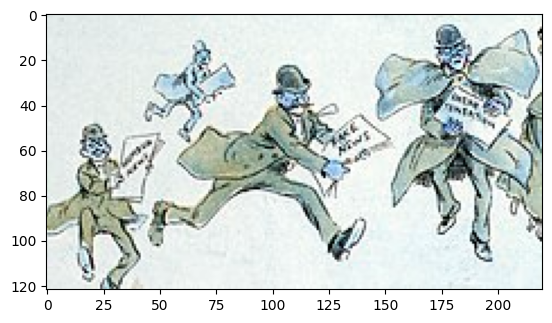

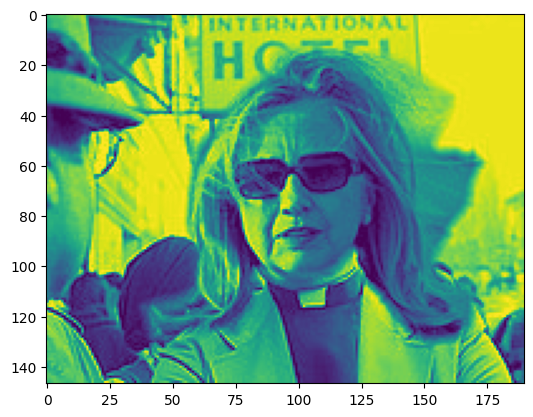

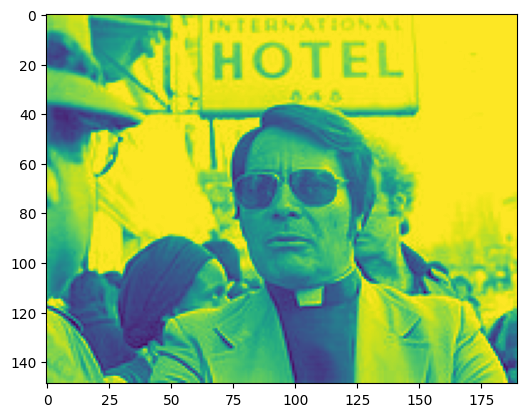

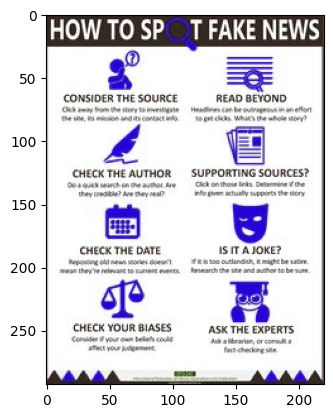

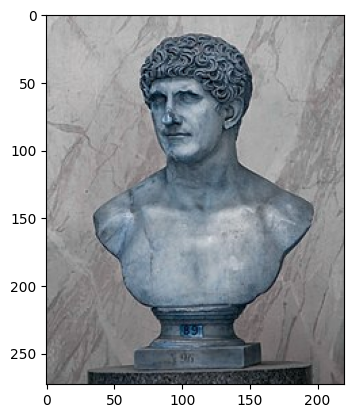

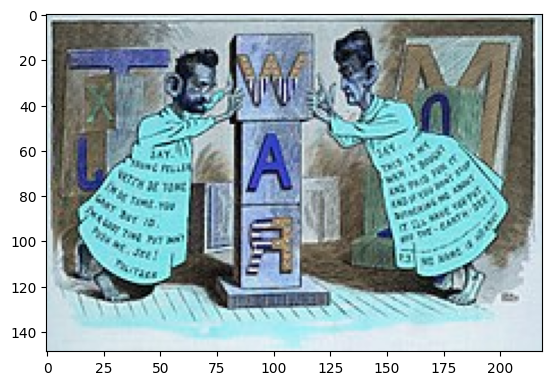

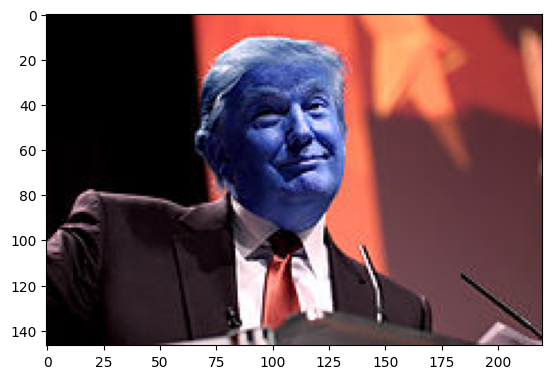

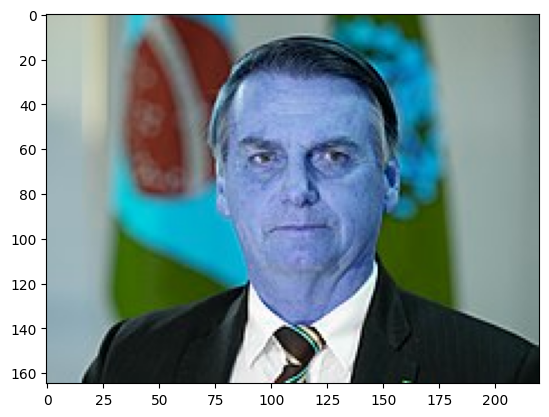

1/1 [==============================] - 1s 598ms/step
Class: fake
Confidence Score: 0.9999732
1/1 [==============================] - 0s 29ms/step
Class: real
Confidence Score: 0.9849681
1/1 [==============================] - 0s 27ms/step
Class: real
Confidence Score: 0.98144585
1/1 [==============================] - 0s 29ms/step
Class: fake
Confidence Score: 1.0
1/1 [==============================] - 0s 36ms/step
Class: real
Confidence Score: 0.99382246
1/1 [==============================] - 0s 35ms/step
Class: fake
Confidence Score: 1.0
1/1 [==============================] - 0s 37ms/step
Class: real
Confidence Score: 0.59638304
1/1 [==============================] - 0s 26ms/step
Class: fake
Confidence Score: 0.99920136
Total no. of images extracted: 8 

No. of real images extracted: 4 

No. of fake images extracted: 4


In [81]:
from readability import Document
import requests
import re
from readability import Document
import requests
import re
import urllib.request
import cv2
import numpy as np
import matplotlib.pyplot as plt
from keras.models import load_model  # TensorFlow is required for Keras to work
from PIL import Image, ImageOps  # Install pillow instead of PIL
import numpy as np
from bs4 import BeautifulSoup
def link_input(link):
    url = link
    # Send a request to the URL and retrieve the page content
    response = requests.get(url)

    # Check if the request was successful
    if response.status_code == 200:
        # Create a Document object from the HTML content
        text = response.text
        cleaned_text = text.replace("&copy;", "")
        doc = Document(cleaned_text)

        # Extract the main text from the Document object
        main_text = doc.summary()
        # Clean up the main text by removing any unwanted characters
        main_text = re.sub(r'\n+', '\n', main_text)
        main_text = re.sub(r'\s+', ' ', main_text)
    
        # Remove any links present in the text
        main_text = re.sub(r'https?://[^\s]+', '', main_text)
        # Remove any texts that match the pattern "<p class="caption">...</p>"
        main_text = re.sub(r'<p class="caption">.*?</p>', '', main_text)
        # Remove any elements starting with "<" and ending with ">"
        main_text = re.sub("<.*?>", "", main_text)
        main_text_text = re.sub(r'\^ .*', '', main_text)


   


        # Extract the title of the web page
        title = doc.title()

        # Clean up the title by removing any unwanted characters
        title = re.sub(r'\n+', '\n', title)
        title = re.sub(r'\s+', ' ', title)
        

       # Print the main text and the title
        print("Title:", title)
        print("\nMain Text:\n", main_text)
    else:
        print("Failed to retrieve the page content")
        print("The input is a link:", link)
    x = [main_text]
    x = tokenizer.texts_to_sequences(x)
    x = pad_sequences(x, maxlen=maxlen) 
    prediction=(model.predict(x) >=0.5).astype(int)
    print("Prediction:", prediction)
     
def text_input(text):
    print("The input is text:", text)
    x = [text]
    x = tokenizer.texts_to_sequences(x)
    x = pad_sequences(x, maxlen=maxlen) 
    prediction=(model.predict(x) >=0.5).astype(int)
    print("Prediction:", prediction)
user_input = input("Enter text or link: ")

if user_input.startswith("http"):
    link_input(user_input)
else:
    text_input(user_input)
    
if user_input.startswith("http"):
    html_page = urllib.request.urlopen(user_input)
    soup = BeautifulSoup(html_page, 'html.parser')
    images = []
    for img in soup.find_all('img'):
        src = img.get('src')
        if src.endswith('.jpg'):
            src = "https:" + src
            images.append(src)

    for image_url in images:
        img_array = np.array(bytearray(urllib.request.urlopen(image_url).read()), dtype=np.uint8)
        img = cv2.imdecode(img_array, cv2.IMREAD_UNCHANGED)
        plt.imshow(img)
        plt.show()
    # Disable scientific notation for clarity
    np.set_printoptions(suppress=True)

# Load the model
    model1 = load_model("keras_model.h5", compile=False)

# Load the labels
    class_names = open("labels.txt", "r").readlines()

# Create the array of the right shape to feed into the keras model
# The 'length' or number of images you can put into the array is
# determined by the first position in the shape tuple, in this case 1
    data = np.ndarray(shape=(1, 224, 224, 3), dtype=np.float32)

# Replace this with the path to your image
    real_image=0
    fake_image=0
    total_image=0
    for image_url in images:
        total_image+=1
        img_array = np.array(bytearray(urllib.request.urlopen(image_url).read()), dtype=np.uint8)
        img = cv2.imdecode(img_array, cv2.IMREAD_UNCHANGED)
        image = Image.fromarray(img).convert("RGB")
        import PIL.Image
        if not hasattr(PIL.Image, 'Resampling'):  # Pillow<9.0
            PIL.Image.Resampling = PIL.Image

    # resizing the image to be at least 224x224 and then cropping from the center
        size = (224, 224)
        image = ImageOps.fit(image, size, Image.Resampling.LANCZOS)

    # turn the image into a numpy array
        image_array = np.asarray(image)

    # Normalize the image
        normalized_image_array = (image_array.astype(np.float32) / 127.5) - 1

    # Load the image into the array
        data[0] = normalized_image_array

    # Predicts the model
        prediction = model1.predict(data)
        index = np.argmax(prediction)
        class_name = class_names[index]
        confidence_score = prediction[0][index]

    # Print prediction and confidence score
        print("Class:", class_name[2:], end="")
        print("Confidence Score:", confidence_score)
        if(index==0):
            real_image+=1
        else:
            fake_image+=1
    print("Total no. of images extracted:",total_image,"\n")
    print("No. of real images extracted:",real_image, "\n")
    print("No. of fake images extracted:",fake_image)